# Import required library


In [ ]:
import pandas as pd
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import patsy
import scipy.stats as stats


# Create DataFrame


In [3]:
df= pd.read_csv('footballer_data.csv')
pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 100)



In [4]:
df.head()


,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,team,contract
0,J. Todibo,22,79,84,245388,190,88,Right,81,CB,5,24500000,37000,48400000,286,49,44,80,78,35,301,66,52,41,70,72,335,68,81,55,76,55,335,60,76,73,81,45,305,72,80,45,56,52,78,238,80,80,78,52,7,13,11,8,13,1852,409,1,75,47,63,67,80,Nice,2021 ~ 2027
1,B. Verbruggen,19,73,83,258498,194,89,Right,73,GK,10,5500000,6000,9400000,74,10,8,15,35,6,89,15,11,15,30,18,244,52,52,32,73,35,218,53,65,21,72,7,99,17,19,4,38,21,30,43,12,17,14,360,75,70,71,68,76,1127,412,1,75,70,71,76,52,Anderlecht,2020 ~ 2025
2,M. Ugarte,21,79,85,253306,182,77,Right,80,CDM,6,26000000,11000,57200000,286,58,65,39,79,45,339,79,54,50,79,77,349,71,72,69,77,60,336,62,53,83,73,65,355,73,83,75,74,50,84,232,77,80,75,53,6,10,16,8,13,1950,433,1,72,63,71,77,75,Sporting CP,2021 ~ 2026
3,Z. Debast,18,70,84,254262,189,76,Right,72,CDM,14,3500000,3000,7400000,296,69,51,68,71,37,331,69,58,59,74,71,310,61,71,56,69,53,327,60,66,74,71,56,295,75,67,53,58,42,67,208,68,71,69,38,6,6,15,6,5,1805,395,1,67,53,67,67,69,Anderlecht,2019 ~ 2025
4,07 D. Last,37,61,60,21555,182,82,Right,61,GK,-1,0,0,0,137,35,32,35,35,0,139,35,0,33,63,8,146,44,46,0,56,0,134,30,0,45,51,8,74,41,0,0,0,33,0,61,28,33,0,248,63,55,63,70,60,939,356,3,63,55,63,60,45,Örgryte,2009


# Check for null values

In [5]:
df.isnull().sum()


name                        0
Age                         0
Overall rating              0
Potential                   0
ID                          0
Height                      0
Weight                      0
foot                        0
Best overall                0
Best position               0
Growth                      0
Value                       0
Wage                        0
Release clause              0
Total attacking             0
Crossing                    0
Finishing                   0
Heading accuracy            0
Short passing               0
Volleys                     0
Total skill                 0
Dribbling                   0
Curve                       0
FK Accuracy                 0
Long passing                0
Ball control                0
Total movement              0
Acceleration                0
Sprint speed                0
Agility                     0
Reactions                   0
Balance                     0
Total power                 0
Shot power

In [6]:
df[['Value']]


,Value
0,24500000
1,5500000
2,26000000
3,3500000
4,0
...,...
2697,11500000
2698,2000000
2699,7000000
2700,1500000


In [7]:
# columns_to_drop = [ "Value", "Wage", "Release clause"]


# df.drop(columns=columns_to_drop, inplace=True)
# df.head()


# Checking the stats overview of the data

In [8]:
df.describe()


,Age,Overall rating,Potential,ID,Height,Weight,Best overall,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
count,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2.702000e+03,2702.000000,2.702000e+03,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000,2702.000000
mean,23.515914,71.976684,78.401925,237167.354552,181.498890,74.891562,73.208734,6.425241,1.039336e+07,27217.561066,1.829158e+07,285.952628,57.235381,54.471873,56.950407,67.205774,50.089193,299.808290,65.626573,56.407846,48.910437,61.157661,67.705774,347.836788,70.801258,70.901925,69.324944,68.659511,68.149149,320.385270,64.706884,66.221318,67.807920,66.905255,54.743893,287.083642,61.126203,51.070688,58.959660,62.422650,53.504441,65.928201,153.566247,51.074019,52.753886,49.738342,71.329016,14.368246,14.164323,14.231680,14.232420,14.465581,1765.961880,389.003701,1.335677,73.003701,59.917839,64.500000,70.211695,53.787195
std,4.416439,7.000437,5.549598,30408.694874,6.905119,7.265658,6.821365,5.549561,1.612582e+07,38354.393778,3.137488e+07,70.326967,17.367239,19.812966,16.740913,12.589518,18.518765,73.571009,17.122057,18.246416,17.634387,13.553094,14.853064,52.175483,13.484867,13.338431,14.191407,9.025300,14.433020,48.555483,12.774376,12.685932,14.438488,12.638067,19.229385,61.693061,16.252041,21.836469,19.381596,13.382219,15.750830,12.664820,63.923570,20.961780,21.995198,21.909342,77.345785,15.988966,15.405311,15.180135,15.743596,16.374078,254.447228,39.500603,0.713373,10.067892,14.266410,9.768393,9.018696,17.897531
min,16.000000,48.000000,56.000000,41.000000,156.000000,52.000000,49.000000,-7.000000,0.000000e+00,0.000000,0.000000e+00,48.000000,7.000000,3.000000,5.000000,14.000000,0.000000,59.000000,5.000000,0.000000,5.000000,15.000000,8.000000,105.000000,15.000000,14.000000,0.000000,34.000000,0.000000,134.000000,17.000000,0.000000,16.000000,24.000000,4.000000,51.000000,12.000000,0.000000,0.000000,0.000000,8.000000,0.000000,23.000000,5.000000,7.000000,0.000000,12.000000,1.000000,2.000000,2.000000,2.000000,2.000000,815.000000,263.000000,1.000000,30.000000,21.000000,30.000000,33.000000,15.000000
25%,20.000000,67.000000,75.000000,227704.750000,176.000000,70.000000,68.000000,1.000000,1.700000e+06,4000.000000,1.600000e+06,258.000000,49.000000,41.000000,48.000000,63.000000,37.000000,270.000000,62.000000,46.000000,37.000000,54.000000,64.000000,324.000000,64.250000,65.000000,63.000000,63.000000,61.000000,290.000000,56.000000,58.000000,62.000000,59.000000,43.000000,260.000000,52.000000,30.000000,52.000000,55.000000,44.000000,60.000000,96.000000,33.000000,33.000000,29.000000,47.000000,8.000000,8.000000,8.000000,8.000000,8.000000,1637.000000,362.000000,1.000000,67.000000,51.000000,58.000000,65.000000,38.000000
50%,23.000000,72.000000,79.000000,242172.000000,182.000000,75.000000,73.500000,6.000000,3.800000e+06,13000.000000,5.700000e+

# Check for duplicates in data

In [9]:
df.duplicated().sum()

0

# Checking top 10 players with highest values

In [10]:
df.sort_values(by='Value', ascending =False).head(10)


,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,team,contract
61,K. Mbappé,23,91,95,231747,182,75,Right,92,ST,4,190500000,230000,366700000,411,78,93,72,85,83,404,93,80,69,71,91,461,97,97,93,93,81,410,88,77,87,76,82,361,64,38,92,83,84,88,92,26,34,32,42,13,5,7,11,6,2181,470,4,97,89,80,92,36,Paris Saint Germain,2018 ~ 2024
30,E. Haaland,21,90,94,239085,195,94,Left,92,ST,4,176500000,240000,339800000,386,47,95,80,75,89,352,78,77,62,53,82,419,82,94,76,93,74,430,94,78,79,93,86,382,87,42,95,74,84,87,123,41,53,29,52,7,14,13,11,7,2144,462,4,89,92,65,80,48,Manchester City,2022 ~ 2027
152,F. de Jong,25,87,92,228702,180,74,Right,89,CM,5,116500000,230000,247600000,383,78,72,72,91,70,413,87,84,64,89,89,417,80,83,87,88,79,373,68,76,89,74,66,374,74,82,77,88,53,90,229,76,76,77,49,7,13,10,10,9,2238,479,3,82,69,86,87,77,FC Barcelona,2019 ~ 2026
12,Vinícius Jr.,21,86,92,238794,176,73,Right,86,LW,6,109000000,200000,245300000,353,72,84,50,75,72,393,92,77,62,73,89,449,95,95,94,82,83,375,76,75,84,64,76,306,58,26,82,75,65,79,75,32,25,18,36,5,7,7,7,10,1987,435,2,95,79,74,90,29,Real Madrid,2018 ~ 2025
120,K. De Bruyne,31,91,91,192985,181,75,Right,91,CM,0,107500000,350000,198900000,410,94,85,55,93,83,441,86,89,83,93,90,393,75,73,76,91,78,409,92,63,89,74,91,405,75,65,88,94,83,88,185,66,66,53,56,15,13,5,10,13,2299,481,4,74,88,93,86,63,Manchester City,2015 ~ 2025
373,Rúben Dias,25,88,91,239818,187,82,Right,90,CB,3,107500000,230000,206900000,284,54,29,87,82,32,308,64,46,48,76,74,328,54,69,60,89,56,345,74,78,77,90,26,313,92,86,39,51,45,81,263,90,88,85,47,7,8,13,7,12,1888,410,3,62,39,66,68,88,Manchester City,2020 ~ 2027
110,J. Kimmich,27,89,90,212622,177,75,Right,89,CDM,1,105500000,130000,182000000,387,91,68,72,87,69,415,82,85,73,90,85,393,77,60,84,88,84,402,78,79,94,68,83,383,89,85,80,85,44,85,247,84,85,78,60,8,15,7,15,15,2287,473,4,68,72,87,84,83,FC Bayern München,2015 ~ 2025
179,H. Kane,28,89,89,202126,188,89,Right,89,ST,0,105500000,240000,200500000,431,80,93,87,84,87,402,83,82,65,86,86,368,67,70,66,92,73,423,92,79,83,83,86,395,80,42,94,87,92,92,124,50,36,38,54,8,10,11,14,11,2197,455,4,69,91,83,83,47,Tottenham Hotspur,2010 ~ 2024
117,Pedri,19,85,92,251854,174,61,Right,86,CAM,7,104500000,115000,235100000,333,68,72,50,87,56,401,87,79,62,85,88,421,82,76,88,85,90,362,68,65,88,73,68,352,62,72,77,88,53,87,204,68,73,63,46,12,7,11,8,8,2119,458,2,79,69,81,87,68,FC Barcelona,2020 ~ 2026
302,G. Donnarumma,23,88,92,230621,196,90,Right,88,GK,4,103500000,110000,199200000,80,12,12,12,36,8,118,28,12,14,34,30,292,50,55,64,85,38,255,59,72,34,72,18,154,30,26,14,60,24,65,50,20,14,16,425,90,82,79,85,89,1374,477,3,90,82,79,89,52,Paris Saint Germain,2021 ~ 2026


# Checking if there are players with value 0 

In [11]:
df[df['Value']==df['Value'].min()]


,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,team,contract
4,07 D. Last,37,61,60,21555,182,82,Right,61,GK,-1,0,0,0,137,35,32,35,35,0,139,35,0,33,63,8,146,44,46,0,56,0,134,30,0,45,51,8,74,41,0,0,0,33,0,61,28,33,0,248,63,55,63,70,60,939,356,3,63,55,63,60,45,Örgryte,2009
180,Z. Ibrahimović,40,80,80,41236,195,102,Right,80,ST,0,0,54000,0,401,71,84,82,77,87,380,74,77,74,72,83,305,55,55,67,77,51,366,86,77,34,85,84,346,84,20,86,83,73,90,89,28,37,24,59,13,15,10,9,12,1946,397,5,55,84,76,76,34,Milan,2020 ~ 2023
184,L. Chávez,26,79,80,222382,178,73,Left,80,CAM,1,0,0,0,331,74,64,48,80,65,396,79,76,82,78,81,383,83,83,71,75,71,359,83,42,88,64,82,362,60,70,76,86,70,72,221,76,75,70,52,7,10,14,9,12,2104,452,1,83,72,80,78,71,Mexico,Free
371,D. Lainez,22,74,82,237995,168,58,Left,75,CAM,8,0,0,0,323,72,64,48,75,64,339,81,67,50,64,77,401,83,71,89,67,91,282,61,58,56,42,65,304,61,39,71,67,66,74,155,50,54,51,57,14,13,14,7,9,1861,389,1,76,64,70,80,49,Mexico,Free
518,F. Tănase,27,71,71,223231,185,71,Right,72,CAM,0,0,0,0,335,70,70,58,73,64,351,69,73,71,70,68,342,76,73,79,74,40,322,69,64,78,43,68,336,55,54,73,74,80,74,108,32,39,37,53,8,16,12,10,7,1847,382,1,74,70,72,69,42,Romania,Free
563,08 K. Klausen,24,63,56,151779,179,74,Left,64,LM,-7,0,0,0,235,69,59,50,57,0,194,49,0,18,54,73,198,81,66,0,51,0,203,48,0,65,51,39,199,69,36,41,0,53,0,50,25,25,0,82,7,25,54,25,25,1161,326,2,73,51,55,58,30,Horsens,2008
590,K. Álvarez,23,75,79,253008,176,66,Right,75,RB,4,0,0,0,299,71,48,60,75,45,306,67,58,41,71,69,388,82,83,78,68,77,299,55,61,80,64,39,318,68,71,66,53,60,70,212,65,75,72,50,15,11,7,11,6,1872,406,1,83,49,67,69,69,Mexico,Free
599,O. Bukari,23,72,74,258608,170,68,Right,72,RW,2,0,0,0,296,59,67,46,66,58,303,76,61,48,46,72,404,87,83,85,66,83,357,67,83,73,63,71,287,61,28,70,67,61,69,115,21,56,38,47,13,6,14,7,7,1809,391,1,85,67,61,75,37,Ghana,Free
658,A. Vega,24,79,82,233260,173,77,Right,82,CAM,3,0,0,0,351,69,76,64,77,65,387,88,72,75,74,78,401,81,79,83,72,86,386,80,70,80,75,81,317,64,26,75,86,66,75,81,44,19,18,43,5,11,12,8,7,1966,422,1,80,77,76,83,32,Mexico,Free
753,J. Gallardo,27,75,75,226045,176,73,Left,75,LB,0,0,0,0,330,75,69,64,73,49,336,76,73,47,66,74,384,84,82,80,67,71,370,75,77,88,71,59,336,65,65,72,69,65,68,209,72,70,67,47,9,7,8,12,11,2012,438,1,83,67,70,75,69,Mexico,Free


In [12]:
df[df['Value']==df['Value'].min()].shape[0]


46

<h2>Remove players with values 0

In [13]:
df=df[df['Value']!=df['Value'].min()]


In [14]:
df[df['Value']==df['Value'].min()]


,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,team,contract
2609,18 M. Calveley,18,49,67,238608,178,68,Right,49,CAM,18,60000,2000,143000,200,37,33,44,55,31,216,48,35,30,55,48,295,63,66,57,48,61,246,45,57,54,54,36,229,57,44,45,43,40,38,114,33,35,46,53,5,14,11,9,14,1353,292,1,65,37,47,50,38,Port Vale,2017 ~ 2018


# Encoding preferred foot of football players

In [15]:
df= pd.get_dummies(df,columns=['foot'], drop_first=True, dtype=int)

In [16]:
df.head()

,name,Age,Overall rating,Potential,ID,Height,Weight,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,team,contract,foot_Right
0,J. Todibo,22,79,84,245388,190,88,81,CB,5,24500000,37000,48400000,286,49,44,80,78,35,301,66,52,41,70,72,335,68,81,55,76,55,335,60,76,73,81,45,305,72,80,45,56,52,78,238,80,80,78,52,7,13,11,8,13,1852,409,1,75,47,63,67,80,Nice,2021 ~ 2027,1
1,B. Verbruggen,19,73,83,258498,194,89,73,GK,10,5500000,6000,9400000,74,10,8,15,35,6,89,15,11,15,30,18,244,52,52,32,73,35,218,53,65,21,72,7,99,17,19,4,38,21,30,43,12,17,14,360,75,70,71,68,76,1127,412,1,75,70,71,76,52,Anderlecht,2020 ~ 2025,1
2,M. Ugarte,21,79,85,253306,182,77,80,CDM,6,26000000,11000,57200000,286,58,65,39,79,45,339,79,54,50,79,77,349,71,72,69,77,60,336,62,53,83,73,65,355,73,83,75,74,50,84,232,77,80,75,53,6,10,16,8,13,1950,433,1,72,63,71,77,75,Sporting CP,2021 ~ 2026,1
3,Z. Debast,18,70,84,254262,189,76,72,CDM,14,3500000,3000,7400000,296,69,51,68,71,37,331,69,58,59,74,71,310,61,71,56,69,53,327,60,66,74,71,56,295,75,67,53,58,42,67,208,68,71,69,38,6,6,15,6,5,1805,395,1,67,53,67,67,69,Anderlecht,2019 ~ 2025,1
5,E. Camavinga,19,81,89,248243,182,68,83,CM,8,52500000,75000,118100000,345,76,62,64,84,59,377,80,72,59,81,85,395,78,79,81,79,78,371,73,70,81,78,69,367,78,77,73,77,62,82,234,75,80,79,50,12,6,8,12,12,2139,460,3,79,66,79,82,76,Real Madrid,2021 ~ 2027,0


<h2>Create boxenplot

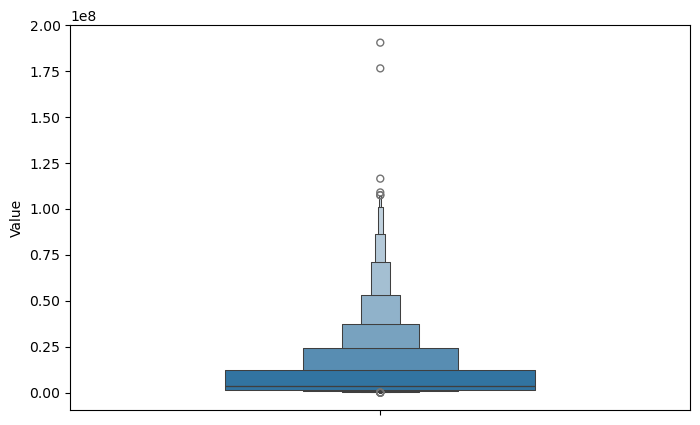

In [17]:
plt.figure(figsize=(8,5))
sns.boxenplot(y='Value', data= df, width= 0.5)
plt.show()

# frequrency distribution of player actual values

/tmp/ipykernel_59220/2757392047.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x).set_title('Frequency Distribution Plot of Player Actual Values')


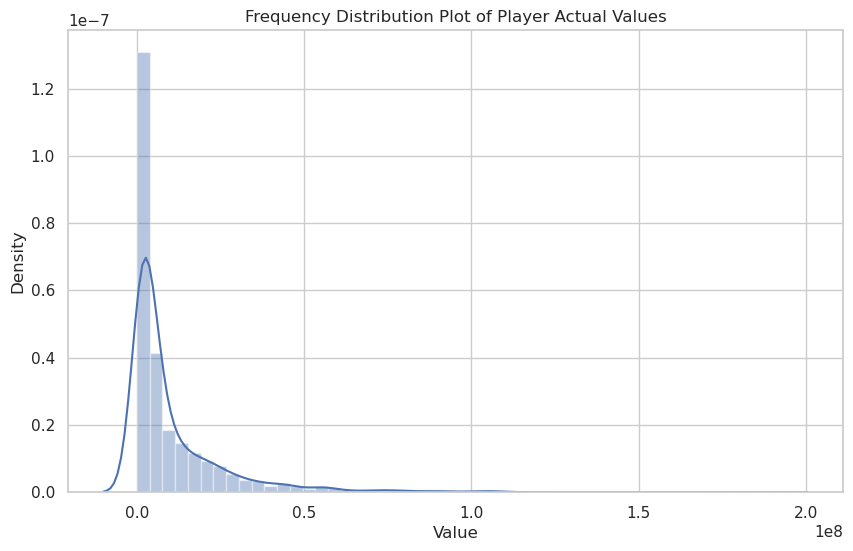

In [18]:
x = df.Value
sns.set(style="whitegrid")
plt.figure(figsize=(10,6))
sns.distplot(x).set_title('Frequency Distribution Plot of Player Actual Values')
plt.show()

<h1> STudy what is this


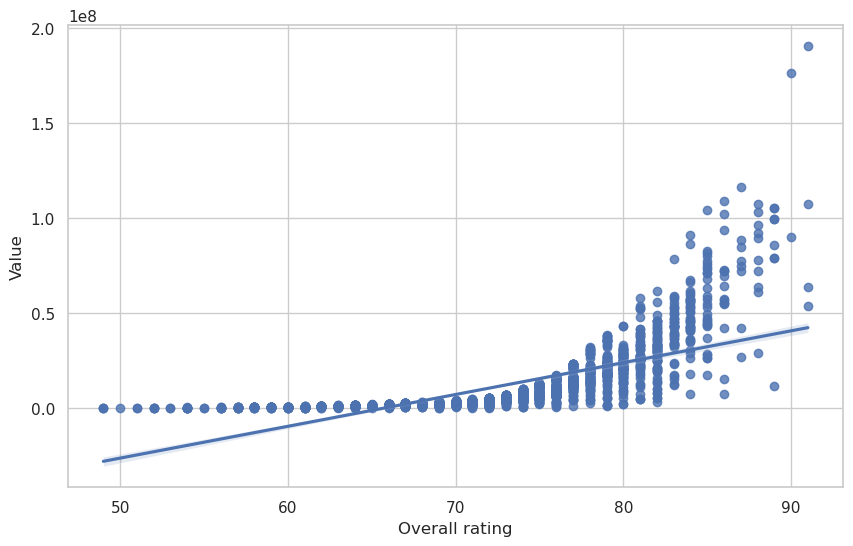

In [19]:

plt.figure(figsize=(10,6))
sns.regplot(x="Overall rating",y="Value",data=df)
plt.show()

<h2>Pie chart of player position distribution

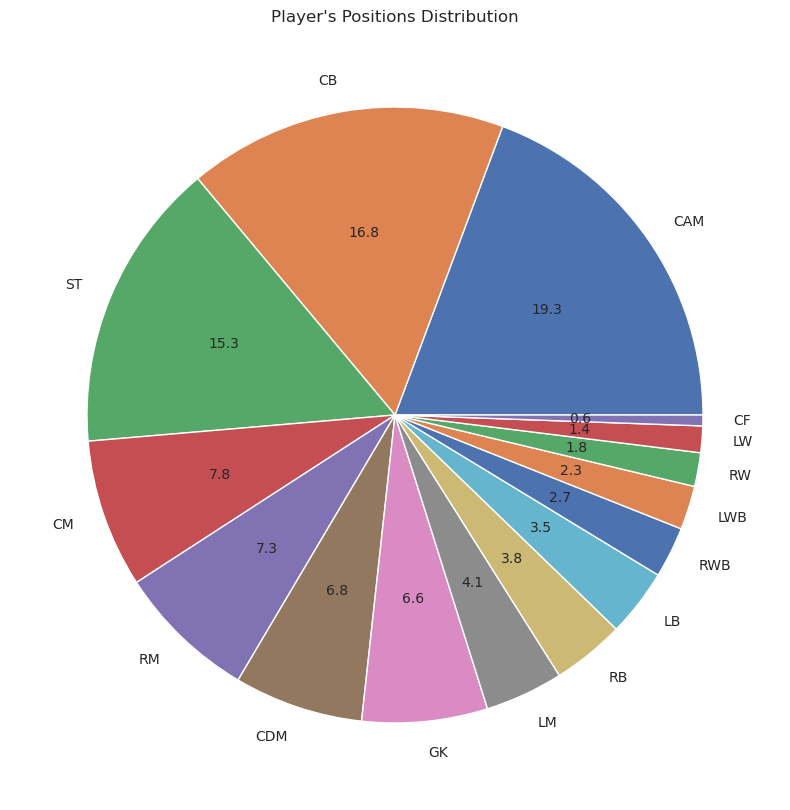

In [20]:
plt.figure(figsize=(10,10))
loc=df['Best position'].value_counts()
loc.plot(kind='pie' ,autopct='%.1f',fontsize=10,subplots=True)
plt.title("Player's Positions Distribution")
plt.ylabel("")
plt.show()


<h2>Catplot of player best position

<Figure size 2000x2000 with 0 Axes>

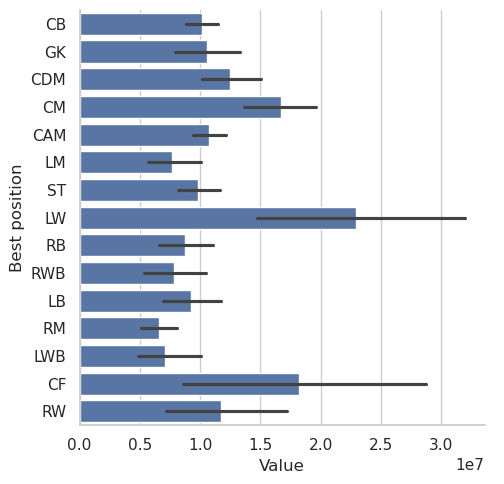

In [21]:
plt.figure(figsize=(10,10),dpi=200)
graph = sns.catplot(y="Best position", x="Value", kind="bar",  data=df)
plt.show()


# Wisker plot of footer value to check ouliers

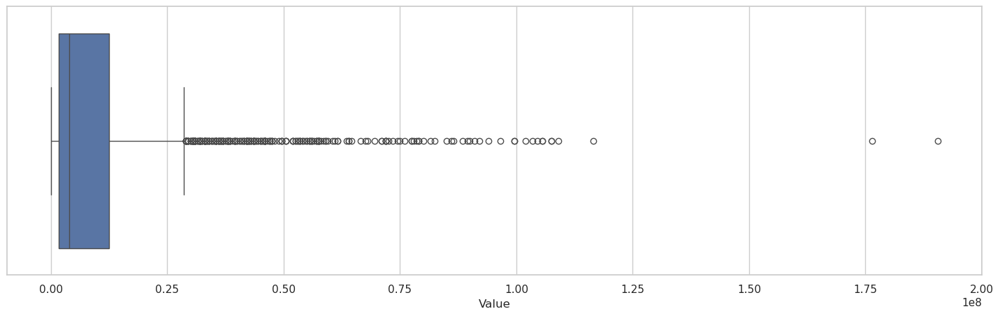

In [22]:

plt.figure(figsize=[18,5])
sns.boxplot(x=df['Value'], data=df);


In [23]:
correlation_matrix = df.select_dtypes(include= [np.number]).corr()

correlation_with_target= correlation_matrix['Value']



Age                         0.200609
Overall rating              0.723413
Potential                   0.615855
ID                         -0.199934
Height                      0.043743
Weight                      0.078506
Best overall                0.726185
Growth                     -0.302655
Value                       1.000000
Wage                        0.786932
Release clause              0.965262
Total attacking             0.324236
Crossing                    0.257464
Finishing                   0.251781
Heading accuracy            0.189676
Short passing               0.406205
Volleys                     0.274130
Total skill                 0.332938
Dribbling                   0.271111
Curve                       0.286079
FK Accuracy                 0.248305
Long passing                0.394878
Ball control                0.331851
Total movement              0.278423
Acceleration                0.149527
Sprint speed                0.164297
Agility                     0.173830
R

In [24]:
sorted_correlation = correlation_with_target.sort_values(ascending=False)
sorted_correlation


# Create a list of tuples with variable name and correlation value pairs


In [25]:
sorted_correlation_list = [(variable, correlation) for variable, correlation in sorted_correlation.items()]


# Display the sorted correlation values and names


In [27]:
print("Sorted correlation values and names:")
for variable, correlation in sorted_correlation_list:
    print(f"{variable}: {correlation}")



Sorted correlation values and names:
Value: 1.0
Release clause: 0.9652618048543862
Wage: 0.7869318111646627
Best overall: 0.7261854028510851
Overall rating: 0.7234132509585884
Reactions: 0.6663740720978062
Potential: 0.6158545938516604
Base stats: 0.615250817729225
International reputation: 0.5538362598176734
Passing / Kicking: 0.5307137470103389
Dribbling / Reflexes: 0.5184442054230907
Composure: 0.498338713972533
Total stats: 0.45035806195055833
Vision: 0.4339979439614241
Short passing: 0.40620511346716176
Long passing: 0.3948775871838477
Total power: 0.3822451195117364
Shot power: 0.36863179291263487
Shooting / Handling: 0.36104703919012127
Total mentality: 0.356284875607681
Total skill: 0.33293832902495285
Ball control: 0.33185114822035444
Total attacking: 0.32423641433422556
Curve: 0.2860792129510587
Stamina: 0.28212363839821486
Total movement: 0.2784229421749946
Volleys: 0.27413001879161036
Dribbling: 0.27111072751294907
Long shots: 0.2708418975948664
Crossing: 0.2574638520807235

<h2>Dropping unneccesary columns

In [28]:

df.drop(['ID','Growth','Wage', 'Release clause','Crossing','Short passing','Volleys','Dribbling','Curve','FK Accuracy','Long passing','Acceleration','Sprint speed','Agility','Reactions','Balance','Jumping','Stamina','Long shots','Aggression','Interceptions','Penalties','Composure','Total defending','Marking','Standing tackle','Sliding tackle','Total goalkeeping','Base stats','contract',
         'Best overall','Total attacking','Heading accuracy','Positioning','Vision','Strength','Total skill','Best position','team','Total stats'
        
   
        ],axis=1,inplace=True)

In [29]:
df.columns

Index(['name', 'Age', 'Overall rating', 'Potential', 'Height', 'Weight',
       'Value', 'Finishing', 'Ball control', 'Total movement', 'Total power',
       'Shot power', 'Total mentality', 'GK Diving', 'GK Handling',
       'GK Kicking', 'GK Positioning', 'GK Reflexes',
       'International reputation', 'Pace / Diving', 'Shooting / Handling',
       'Passing / Kicking', 'Dribbling / Reflexes', 'Defending / Pace',
       'foot_Right'],
      dtype='object')

# Correlation heat map with new columns

Text(0.5, 1.0, 'Correlation Heatmap')

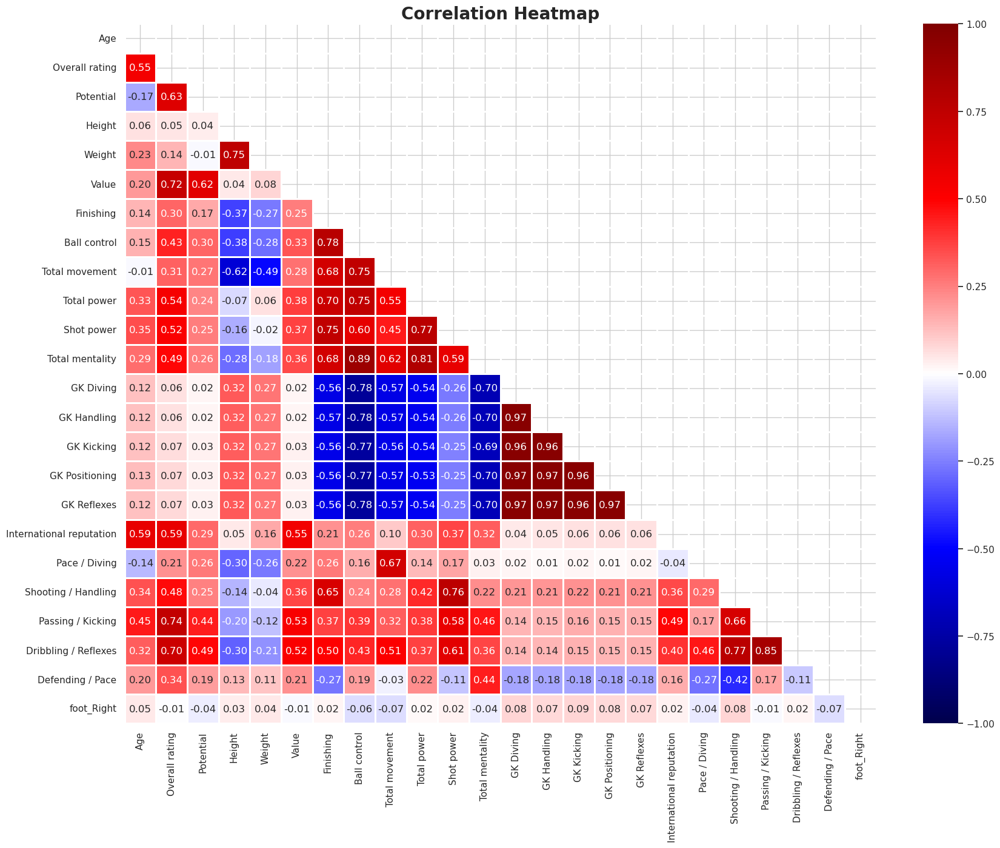

In [33]:
corr_matrix = df.select_dtypes(include=[np.number]).corr()
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)

In [39]:
df = df.drop(['Height','Weight','foot_Right'],axis=1)


# Correlation heat map with new columns

Text(0.5, 1.0, 'Correlation Heatmap')

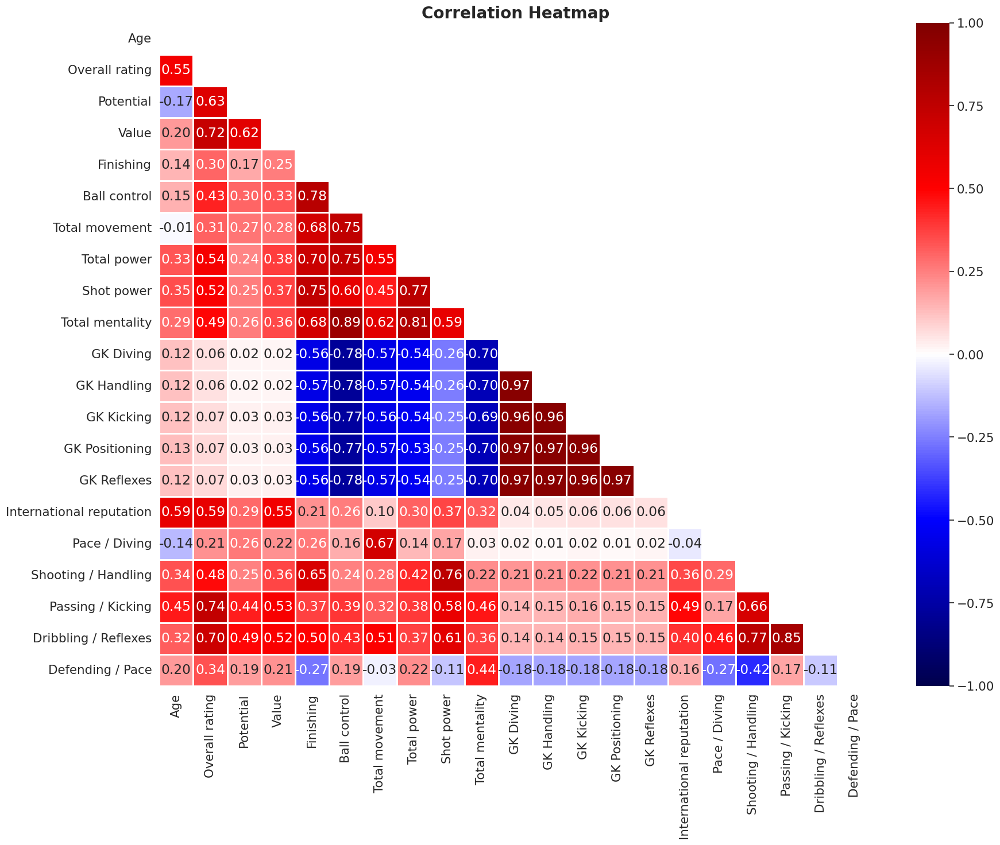

In [40]:
corr_matrix = df.select_dtypes(include=[np.number]).corr()
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)

# Distributoin of scoring ratings

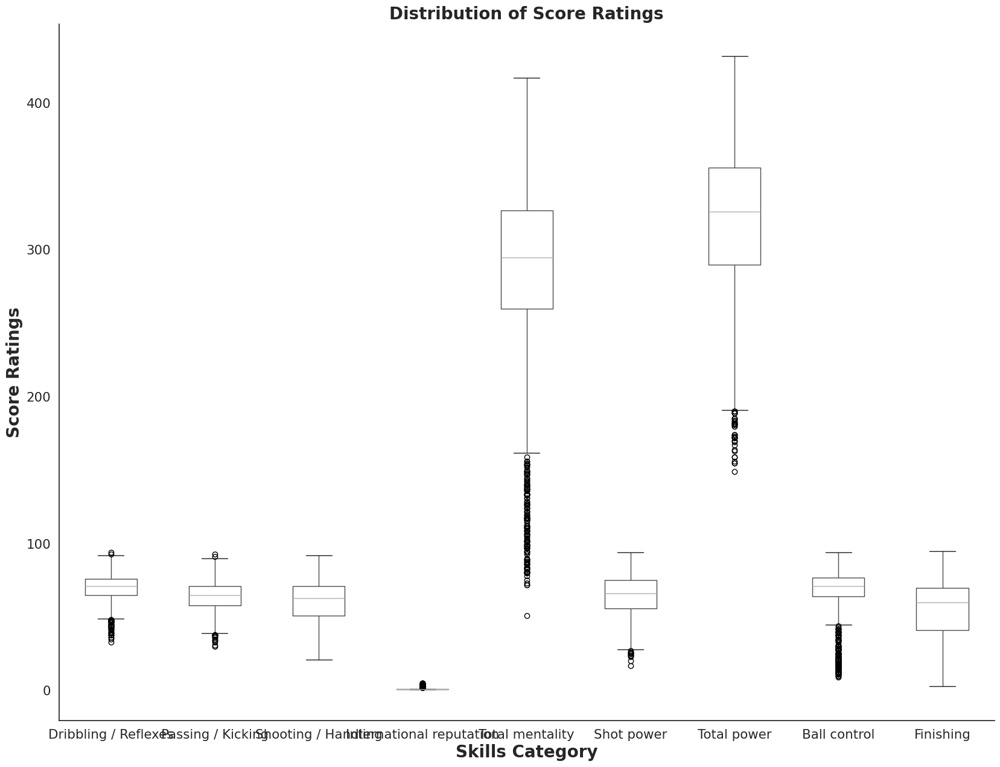

In [41]:
fig = plt.figure(figsize=[20,15])
sns.set(style='white', font_scale=1.4)
df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']].boxplot()
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()

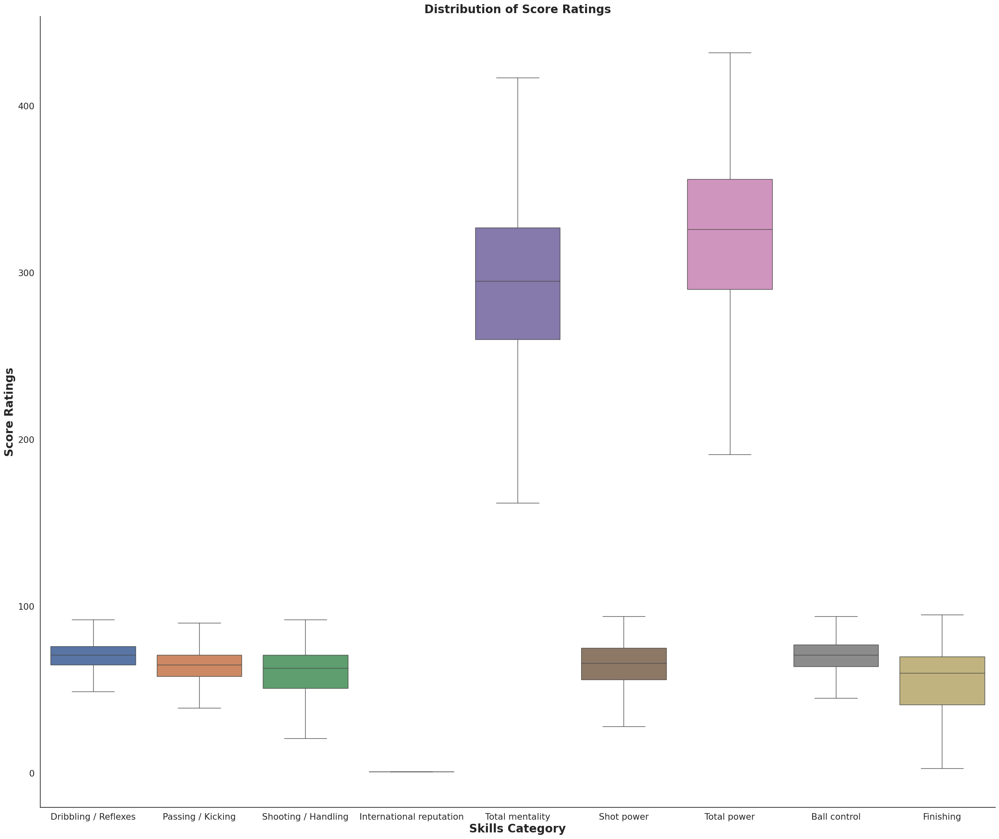

In [42]:
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']]
sns.boxplot(data=data, showfliers=False)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()

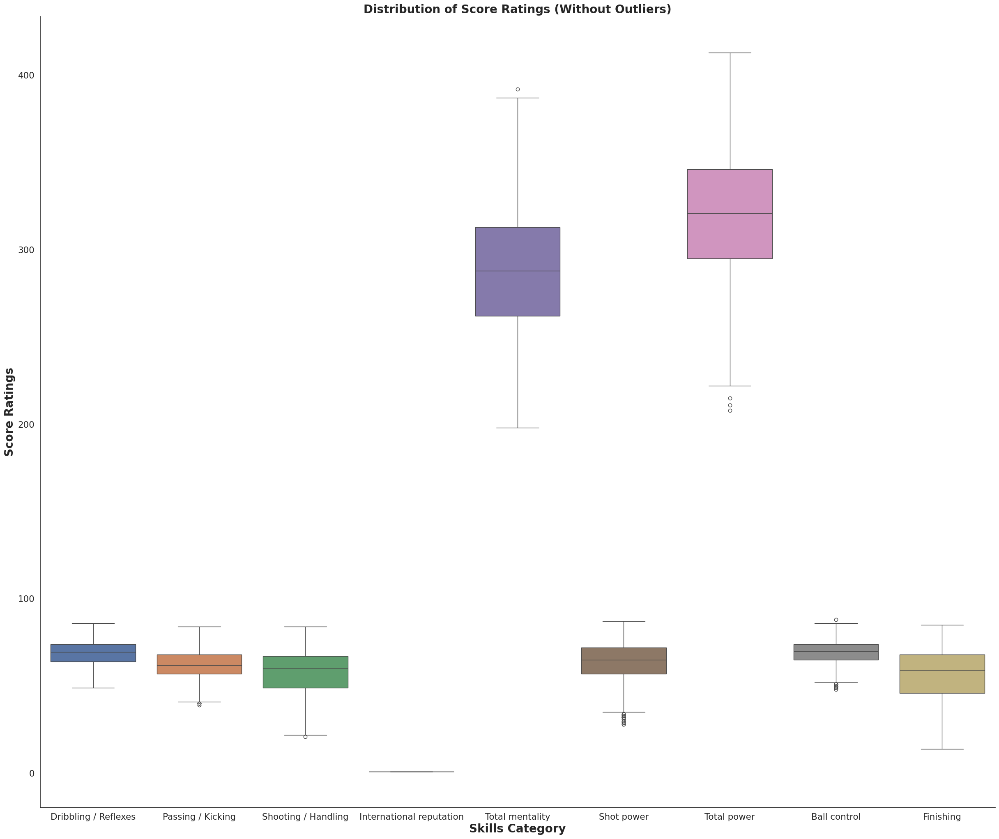

In [46]:
numeric_df = df.select_dtypes(include=[np.number])
# Calculate the IQR for each column
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1

# Define the upper and lower bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# # Filter out the outliers from the dataset
# filtered_df = numeric_df[~((numeric_df < lower_bound) | (numeric_df > upper_bound)).any(axis=1)]
clipped_df = numeric_df.clip(lower=lower_bound, upper=upper_bound, axis=1)



# Create the boxplot with the filtered dataset
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = clipped_df[['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']]
sns.boxplot(data=data)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings (Without Outliers)', fontsize=20, weight='bold')
sns.despine()

<h2>pairwise scatter plot showing the relationship between the variables in the data set

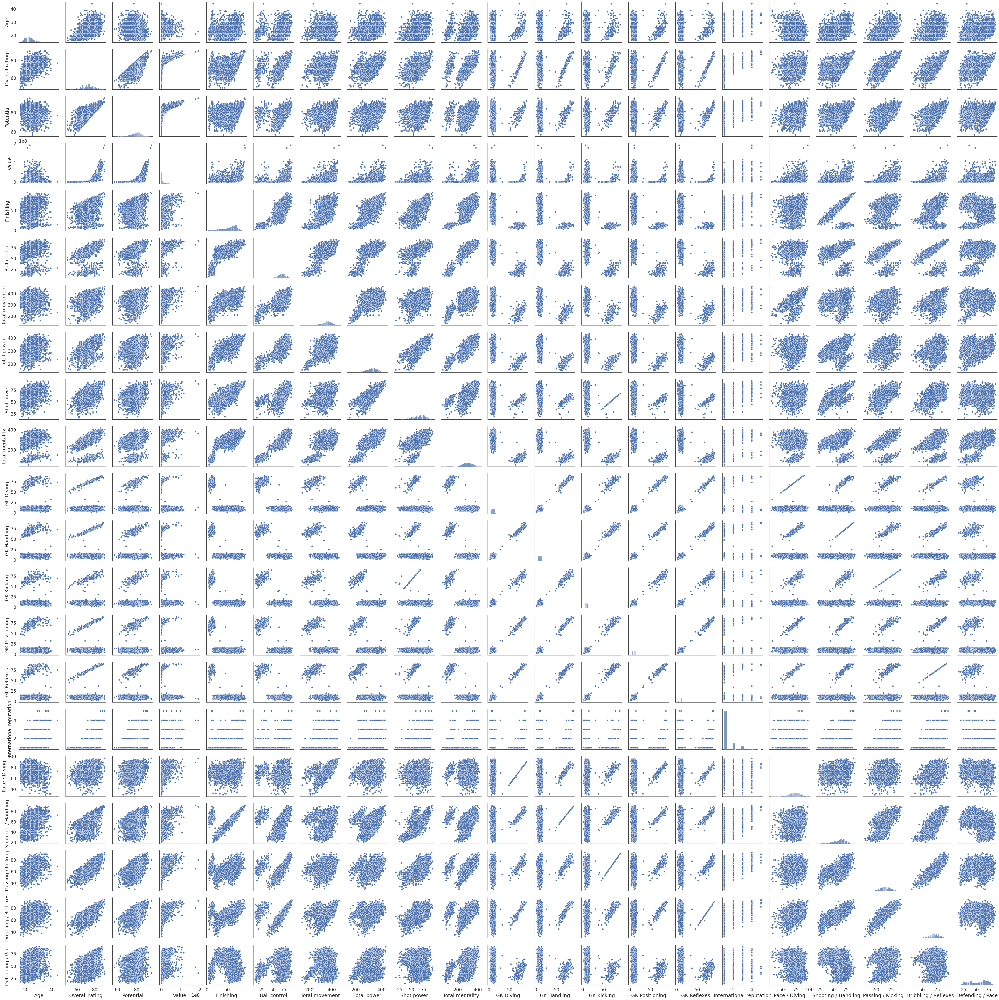

In [47]:
numeric_df = df.select_dtypes(include=[np.number])

sns.set(style='white',font_scale=1.5)
sns.pairplot(df)

<h2>
Selecting the features that affect the correlation the most and assigning them to the new dataset

In [49]:
selected_columns = ['name','Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing','Value']
new_df = df[selected_columns].copy()
new_df.head()

,name,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Value
0,J. Todibo,22,67,63,47,1,305,60,335,72,44,24500000
1,B. Verbruggen,19,76,71,70,1,99,53,218,18,8,5500000
2,M. Ugarte,21,77,71,63,1,355,62,336,77,65,26000000
3,Z. Debast,18,67,67,53,1,295,60,327,71,51,3500000
5,E. Camavinga,19,82,79,66,3,367,73,371,85,62,52500000


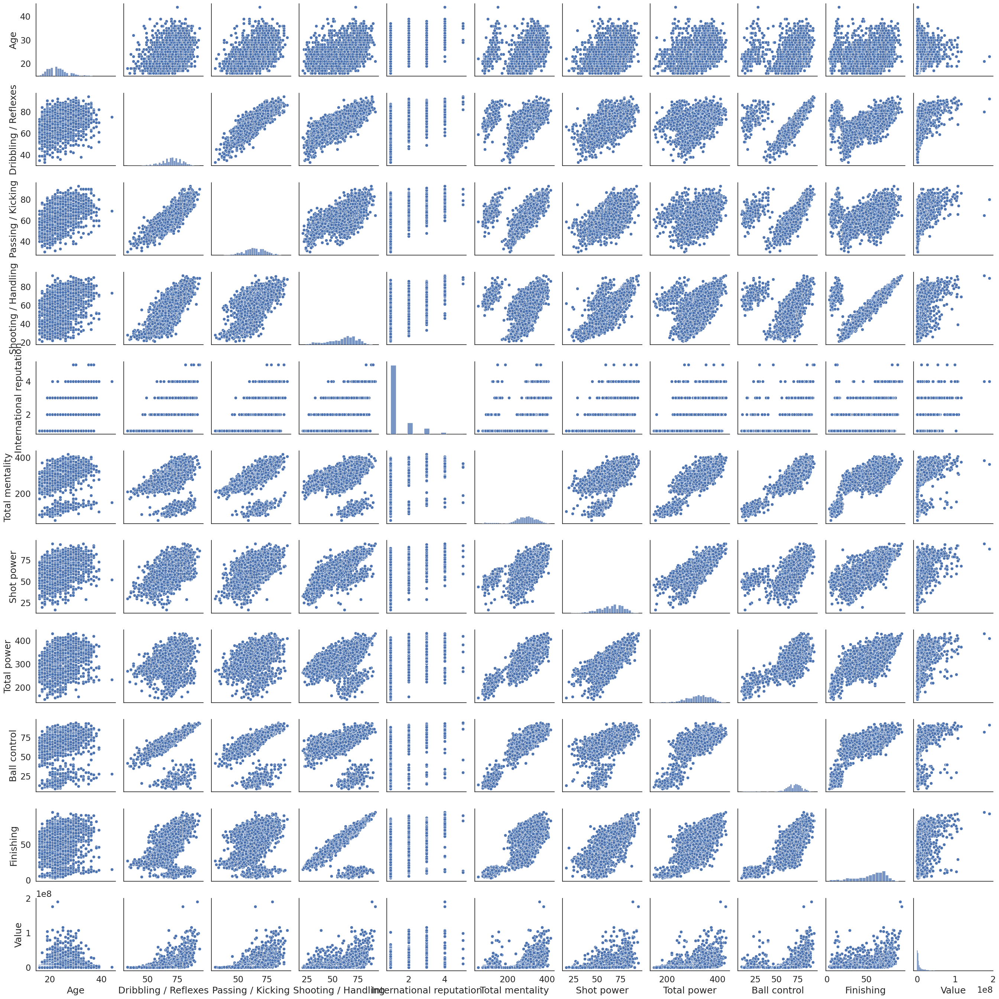

In [50]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(new_df)

In [55]:
y, X = patsy.dmatrices("Q('Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=new_df, return_type="dataframe")
model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Q('Value')   R-squared:                       0.528
Model:                            OLS   Adj. R-squared:                  0.526
Method:                 Least Squares   F-statistic:                     295.9
Date:                Sun, 29 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:05:30   Log-Likelihood:                -46863.
No. Observations:                2656   AIC:                         9.375e+04
Df Residuals:                    2645   BIC:                         9.381e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -5.713e+07   2.48e+06    -23.079      0.000    -6.2e+07   -5.23e+07
Q('Age')                      -1.303e+06   6.76e+04    -19.270      0.000   -1.44e+06   -1.17e+06
Q('Dribbling / Reflexes')      4.121e+05      7e+04      5.888      0.000    2.75e+05    5.49e+05
Q('Passing / Kicking')         1.852e+05   5.96e+04      3.106      0.002    6.83e+04    3.02e+05
Q('Shooting / Handling')       3.332e+05   8.15e+04      4.088      0.000    1.73e+05    4.93e+05
Q('International reputation')  1.172e+07   4.07e+05     28.764      0.000    1.09e+07    1.25e+07
Q('Total mentality')           3984.1807   1.09e+04      0.364      0.716   -1.75e+04    2.54e+04
Q('Shot power')               -3.456e+05   4.63e+04     -7.460      0.000   -4.36e+05   -2.55e+05
Q('Total power')               1.497e+05   1.05e+04     14.229      0.000    1.29e+05     1.7e+05
Q('Ball control')              2.023e+05   6.51e+04      3.107      0.002    7.46e+04     3.3e+05
Q('Finishing')                -3.431e+05      5e+04     -6.863      0.000   -4.41e+05   -2.45e+05
==============================================================================
Omnibus:                     1725.196   Durbin-Watson:                   1.559
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            41778.363
Skew:                           2.682   Prob(JB):                         0.00
Kurtosis:                      21.674   Cond. No.                     5.32e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.32e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [57]:
df1 = new_df.copy()


In [58]:
mask = new_df['Value'] > 0  # Create a boolean mask for non-zero values
df1['Value'] = np.log(new_df.loc[mask, 'Value'])  # Apply log only to non-zero values

In [59]:
df1 = df1.rename(columns={'Value':'Log Market Value'})


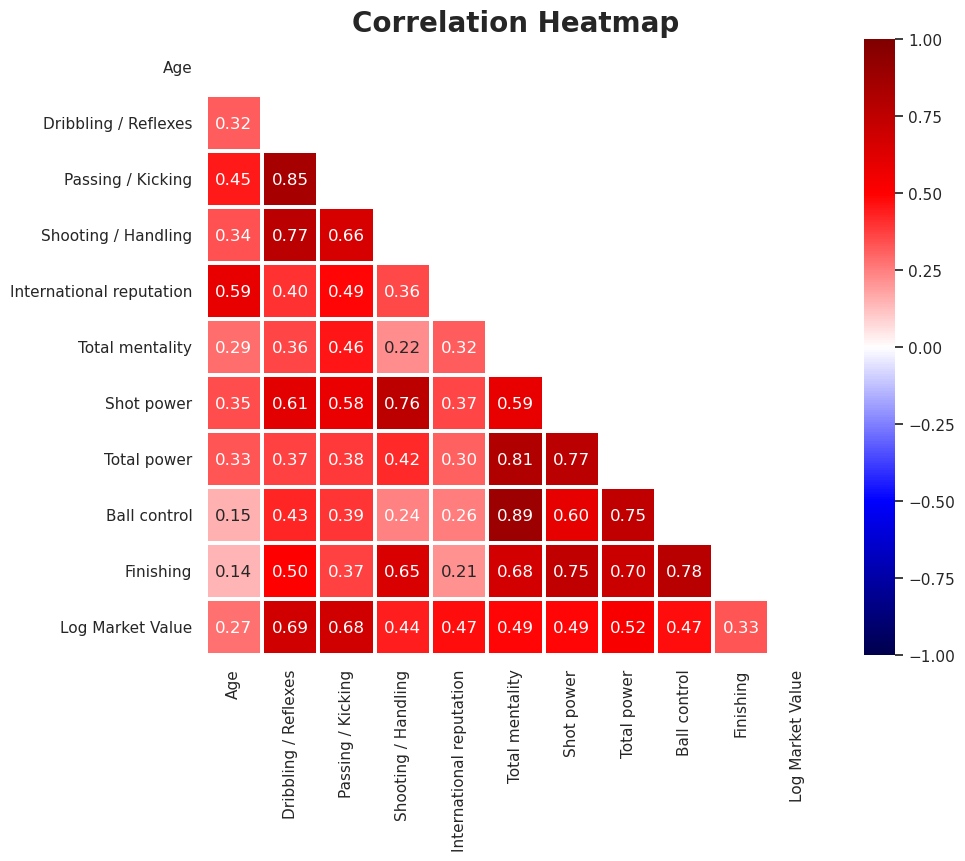

In [68]:

sns.set(font_scale=1,style='white')
corr_matrix = df1.select_dtypes(include= [np.number]).corr()
fig = plt.figure(figsize=[10,8])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1.5,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
plt.savefig('heatmap3.png',transparent=True, bbox_inches='tight')

In [ ]:

sns.set(style='white', font_scale=1.5)
sns.pairplot(df1)
plt.savefig('pairplot2.png', transparent=True, bbox_inches='tight')

<h2>
Taking the logarithm of the market values created a normal distribution and increased the R-sq value

In [61]:
y, X = patsy.dmatrices("Q('Log Market Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=df1, return_type="dataframe")

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Q('Log Market Value')   R-squared:                       0.696
Model:                               OLS   Adj. R-squared:                  0.695
Method:                    Least Squares   F-statistic:                     606.0
Date:                   Sun, 29 Dec 2024   Prob (F-statistic):               0.00
Time:                           21:09:37   Log-Likelihood:                -2975.5
No. Observations:                   2656   AIC:                             5973.
Df Residuals:                       2645   BIC:                             6038.
Df Model:                             10                                         
Covariance Type:               nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         5.7663      0.165     34.956      0.000       5.443       6.090
Q('Age')                         -0.0681      0.005    -15.122      0.000      -0.077      -0.059
Q('Dribbling / Reflexes')         0.0623      0.005     13.370      0.000       0.053       0.071
Q('Passing / Kicking')            0.0184      0.004      4.640      0.000       0.011       0.026
Q('Shooting / Handling')          0.0312      0.005      5.749      0.000       0.021       0.042
Q('International reputation')     0.4184      0.027     15.412      0.000       0.365       0.472
Q('Total mentality')              0.0003      0.001      0.383      0.702      -0.001       0.002
Q('Shot power')                  -0.0286      0.003     -9.274      0.000      -0.035      -0.023
Q('Total power')                  0.0156      0.001     22.206      0.000       0.014       0.017
Q('Ball control')                 0.0347      0.004      7.987      0.000       0.026       0.043
Q('Finishing')                   -0.0444      0.003    -13.316      0.000      -0.051      -0.038
==============================================================================
Omnibus:                       38.187   Durbin-Watson:                   1.663
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.631
Skew:                           0.268   Prob(JB):                     1.50e-09
Kurtosis:                       3.281   Cond. No.                     5.32e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.32e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [66]:
df1.isnull().sum()

name                        0
Age                         0
Dribbling / Reflexes        0
Passing / Kicking           0
Shooting / Handling         0
International reputation    0
Total mentality             0
Shot power                  0
Total power                 0
Ball control                0
Finishing                   0
Log Market Value            0
dtype: int64

In [69]:
df1.drop(columns=['name'],inplace=True)

In [ ]:
# selected_columns2 = ['Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Shot power', 'Total power', 
#                      'Ball control', 'Finishing']

# selected_columns = ['name','Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power',
#                      'Total power', 'Ball control', 'Finishing','Value']


In [70]:
df1.head()

,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Log Market Value
0,22,67,63,47,1,305,60,335,72,44,17.014184
1,19,76,71,70,1,99,53,218,18,8,15.520259
2,21,77,71,63,1,355,62,336,77,65,17.073607
3,18,67,67,53,1,295,60,327,71,51,15.068274
5,19,82,79,66,3,367,73,371,85,62,17.776324


In [74]:
df1.to_csv('footballer_data_final.csv', index=False)

: 